In [17]:
import datetime
from datetime import date
import geopandas as gpd
from shapely.geometry import Point
import numpy as np
import os
import sys
import xarray as xr
import pandas as pd
import netCDF4 as nc
import matplotlib.pyplot as plt
from scipy.integrate import trapz
from scipy.stats import norm
import seaborn as sns

In [18]:
CANSWE_v6 = 'C:/Users/walimunige.rupasingh/OneDrive - University of Calgary/Documents/Reasearch/Snow_drought_indicator/snowdroughtindex/data/input_data/CANSWE-CanEEN_1928-2023_v6.nc'
Bow_at_Banff = 'C:/Users/walimunige.rupasingh/OneDrive - University of Calgary/Documents/Reasearch/Snow_drought_indicator/snowdroughtindex/data/input_data/Bow_at_Banff/basins_testcases.shp'
coordinates_updated = 'C:/Users/walimunige.rupasingh/OneDrive - University of Calgary/Documents/Reasearch/Snow_drought_indicator/snowdroughtindex/data/input_data/Snow_Survey_Coords_Update_2024.csv'
gridded_SWE = 'C:/Users/walimunige.rupasingh/OneDrive - University of Calgary/Documents/Reasearch/Data/SWE_gridded/'
output_dir = 'C:/Users/walimunige.rupasingh/OneDrive - University of Calgary/Documents/Reasearch/Snow_drought_indicator/snowdroughtindex/data/output_data/'

In [19]:
# Read the netCDF file
SWE_v6 = xr.open_dataset(CANSWE_v6)

SWE_v6_data = SWE_v6.to_dataframe()

display(SWE_v6_data)

lat         lon  elevation               source  \
station_id  time                                                                
ALE-05AA805 1928-01-01  49.266666 -114.349998     1525.0  Alberta Environment   
            1928-01-02  49.266666 -114.349998     1525.0  Alberta Environment   
            1928-01-03  49.266666 -114.349998     1525.0  Alberta Environment   
            1928-01-04  49.266666 -114.349998     1525.0  Alberta Environment   
            1928-01-05  49.266666 -114.349998     1525.0  Alberta Environment   
...                           ...         ...        ...                  ...   
RTA-CQCS    2023-07-27  48.753777   71.831528      501.0      Rio Tinto Alcan   
            2023-07-28  48.753777   71.831528      501.0      Rio Tinto Alcan   
            2023-07-29  48.753777   71.831528      501.0      Rio Tinto Alcan   
            2023-07-30  48.753777   71.831528      501.0      Rio Tinto Alcan   
            2023-07-31  48.753777   71.831528      501.0      Rio Tinto Alcan   

                            station_name station_name_sec  station_name_ter  \
station_id  time                                                              
ALE-05AA805 1928-01-01  WEST CASTLE SNOW      WEST CASTLE  WEST CASTLE OPEN   
            1928-01-02  WEST CASTLE SNOW      WEST CASTLE  WEST CASTLE OPEN   
            1928-01-03  WEST CASTLE SNOW      WEST CASTLE  WEST CASTLE OPEN   
            1928-01-04  WEST CASTLE SNOW      WEST CASTLE  WEST CASTLE OPEN   
            1928-01-05  WEST CASTLE SNOW      WEST CASTLE  WEST CASTLE OPEN   
...                                  ...              ...               ...   
RTA-CQCS    2023-07-27      CHUTE SAVANE             None              None   
            2023-07-28      CHUTE SAVANE             None              None   
            2023-07-29      CHUTE SAVANE             None              None   
            2023-07-30      CHUTE SAVANE             None              None   
            2023-07-31      CHUTE SAVANE             None              None   

                       station_id_sec station_id_ter  type_mes   snw  snd  \
station_id  time                                                            
ALE-05AA805 1928-01-01      SCD-AL219      SCD-AL221         0   NaN  NaN   
            1928-01-02      SCD-AL219      SCD-AL221         0   NaN  NaN   
            1928-01-03      SCD-AL219      SCD-AL221         0   NaN  NaN   
            1928-01-04      SCD-AL219      SCD-AL221         0   NaN  NaN   
            1928-01-05      SCD-AL219      SCD-AL221         0   NaN  NaN   
...                               ...            ...       ...   ...  ...   
RTA-CQCS    2023-07-27           None           None         3  5.50  NaN   
            2023-07-28           None           None         3  4.50  NaN   
            2023-07-29           None           None         3  3.25  NaN   
            2023-07-30           None           None         3  2.50  NaN   
            2023-07-31           None           None         3  2.00  NaN   

                        den data_flag_snw data_flag_snd qc_flag_snw  \
station_id  time                                                      
ALE-05AA805 1928-01-01  NaN           b''           b''         b''   
            1928-01-02  NaN           b''           b''         b''   
            1928-01-03  NaN           b''           b''         b''   
            1928-01-04  NaN           b''           b''         b''   
            1928-01-05  NaN           b''           b''         b''   
...                     ...           ...           ...         ...   
RTA-CQCS    2023-07-27  NaN           b''          b'M'         b''   
            2023-07-28  NaN           b''          b'M'         b''   
            2023-07-29  NaN           b''          b'M'         b''   
            2023-07-30  NaN           b''          b'M'         b''   
            2023-07-31  NaN           b''          b'M'         b''   

                      

In [20]:
# List variables and check attributes
for var in SWE_v6.variables:
    print(f"{var}: {SWE_v6[var].attrs.get('units', 'No units')}")

lat: degrees_north
lon: degrees_east
elevation: m
source: No units
station_name: No units
station_name_sec: No units
station_name_ter: No units
station_id_sec: No units
station_id_ter: No units
type_mes: No units
snw: kg m**-2
snd: m
den: kg m**-3
data_flag_snw: No units
data_flag_snd: No units
qc_flag_snw: No units
qc_flag_snd: No units
station_id: No units
time: No units


In [21]:
# select stations within the study area

Bow_at_Banff_shapefile = gpd.read_file(Bow_at_Banff)
Bow_at_Banff_shapefile = Bow_at_Banff_shapefile.to_crs(epsg=4326) # convert to WGS84
Bow_shapefile = Bow_at_Banff_shapefile[Bow_at_Banff_shapefile["Station_Na"]=="BOW RIVER AT BANFF"]


In [22]:
# Create a GeoDataFrame from the DataFrame
geometry = [Point(xy) for xy in zip(SWE_v6_data['lon'], SWE_v6_data['lat'])]
crs = {'init': 'epsg:4326'}
SWE_v6_gdf = gpd.GeoDataFrame(SWE_v6_data, crs=crs, geometry=geometry)

# Select the stations within the study area
SWE_v6_gdf = gpd.sjoin(SWE_v6_gdf, Bow_shapefile, how='inner', op='intersects')

print(SWE_v6_gdf.head())




c:\Users\walimunige.rupasingh\AppData\Local\anaconda3\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
c:\Users\walimunige.rupasingh\AppData\Local\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py:3445: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_25476\4267616595.py:7: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=eps

                              lat         lon  elevation               source  \
station_id  time                                                                
ALE-05BA811 1928-01-01  51.700001 -116.466667     2080.0  Alberta Environment   
            1928-01-02  51.700001 -116.466667     2080.0  Alberta Environment   
            1928-01-03  51.700001 -116.466667     2080.0  Alberta Environment   
            1928-01-04  51.700001 -116.466667     2080.0  Alberta Environment   
            1928-01-05  51.700001 -116.466667     2080.0  Alberta Environment   

                            station_name station_name_sec station_name_ter  \
station_id  time                                                             
ALE-05BA811 1928-01-01  BOW SUMMIT (OLD)             None             None   
            1928-01-02  BOW SUMMIT (OLD)             None             None   
            1928-01-03  BOW SUMMIT (OLD)             None             None   
            1928-01-04  BOW SUMMIT (OLD)  

In [36]:
#update the coordinates of the stations
coordinates = pd.read_csv(coordinates_updated)
#rename Station_ID to station_id
coordinates.rename(columns={"Station ID": "station_id"}, inplace=True)
print(coordinates.head())


       Station Name   station_id      Lat.        Lon.   Elevation    New_Lat  \
0      ALLISON PASS  ALE-05AA803  49.733334 -114.600000       1980  49.745268   
1         BOW RIVER  ALE-05BA801  51.416668 -116.183334       1580  51.423086   
2  BOW SUMMIT (NEW)  ALE-05BA813  51.709000 -116.478750       2031  51.710013   
3      CHATEAU LAWN  ALE-05BA808  51.416668 -116.216670       1740  51.424427   
4      CUTHEAD LAKE  ALE-05BD801  51.450000 -115.750000       2210  51.451060   

      New_Lon  New_Elevation  Unnamed: 8  
0 -114.612210    1854.000000         NaN  
1 -116.183692    1547.164750         NaN  
2 -116.478075    1968.400000         NaN  
3 -116.213312    1701.393546         NaN  
4 -115.749000    2205.300000         NaN  


In [37]:
# Inspect the column names of the coordinates DataFrame
print(coordinates.columns)
print(SWE_v6_gdf.columns)

# Drop the geometry column before converting to xarray Dataset
SWE_v6_gdf_no_geometry = SWE_v6_gdf.drop(columns='geometry')
SWE_bow = xr.Dataset.from_dataframe(SWE_v6_gdf_no_geometry)

nc_station_id = SWE_bow['Station_ID'].values.flatten()
nc_lat = SWE_bow['lat'].values.flatten()
nc_lon = SWE_bow['lon'].values.flatten()

# Create a mapping for quick lookup from the .csv file
csv_station_map = coordinates.set_index('station_id')[['New_Lat', 'New_Lon']].to_dict('index')

# Update lat/lon in the .nc file
updated_lat = nc_lat.copy()
updated_lon = nc_lon.copy()
for i, sid in enumerate(nc_station_id):
    if sid in csv_station_map:
        updated_lat[i] = csv_station_map[sid]['New_Lat']
        updated_lon[i] = csv_station_map[sid]['New_Lon']

# Assign the updated coordinates back to the .nc file
SWE_bow['lat'] = (('station_id', 'time'), updated_lat.reshape(SWE_bow['lat'].shape))
SWE_bow['lon'] = (('station_id', 'time'), updated_lon.reshape(SWE_bow['lon'].shape))

# Create a new netCDF file
SWE_v6_updated = xr.Dataset.from_dataframe(SWE_bow.to_dataframe())
updated_nc_file = "updated__bow_file.nc"
SWE_v6_updated.to_netcdf(updated_nc_file)
print(f"Updated .nc file saved as {updated_nc_file}")


Index(['Station Name', 'station_id', 'Lat. ', 'Lon. ', 'Elevation', 'New_Lat',
       'New_Lon', 'New_Elevation', 'Unnamed: 8'],
      dtype='object')
Index(['lat', 'lon', 'elevation', 'source', 'station_name', 'station_name_sec',
       'station_name_ter', 'station_id_sec', 'station_id_ter', 'type_mes',
       'snw', 'snd', 'den', 'data_flag_snw', 'data_flag_snd', 'qc_flag_snw',
       'qc_flag_snd', 'geometry', 'index_right', 'Station_ID', 'Station_Na',
       'Area_km2', 'Source'],
      dtype='object')
Updated .nc file saved as updated__bow_file.nc


In [38]:
# Merge the two DataFrames on 'station_id'
merged_df = SWE_v6_gdf.merge(coordinates, on='station_id', how='left', suffixes=('', '_new'))

# Update the coordinates in SWE_v6_gdf if they exist in coordinates
SWE_v6_gdf['lat'] = merged_df['New_Lat'].combine_first(SWE_v6_gdf['lat'])
SWE_v6_gdf['lon'] = merged_df['New_Lon'].combine_first(SWE_v6_gdf['lon'])

# Update the geometry column based on the new coordinates
SWE_v6_gdf['geometry'] = gpd.points_from_xy(SWE_v6_gdf['lon'], SWE_v6_gdf['lat'])

print(SWE_v6_gdf.head())


C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_30016\13449946.py:5: RuntimeWarning: '<' not supported between instances of 'tuple' and 'int', sort order is undefined for incomparable objects.
  SWE_v6_gdf['lat'] = merged_df['New_Lat'].combine_first(SWE_v6_gdf['lat'])
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_30016\13449946.py:6: RuntimeWarning: '<' not supported between instances of 'tuple' and 'int', sort order is undefined for incomparable objects.
  SWE_v6_gdf['lon'] = merged_df['New_Lon'].combine_first(SWE_v6_gdf['lon'])


                              lat         lon  elevation               source  \
station_id  time                                                                
ALE-05BA811 1928-01-01  51.700001 -116.466667     2080.0  Alberta Environment   
            1928-01-02  51.700001 -116.466667     2080.0  Alberta Environment   
            1928-01-03  51.700001 -116.466667     2080.0  Alberta Environment   
            1928-01-04  51.700001 -116.466667     2080.0  Alberta Environment   
            1928-01-05  51.700001 -116.466667     2080.0  Alberta Environment   

                            station_name station_name_sec station_name_ter  \
station_id  time                                                             
ALE-05BA811 1928-01-01  BOW SUMMIT (OLD)             None             None   
            1928-01-02  BOW SUMMIT (OLD)             None             None   
            1928-01-03  BOW SUMMIT (OLD)             None             None   
            1928-01-04  BOW SUMMIT (OLD)  

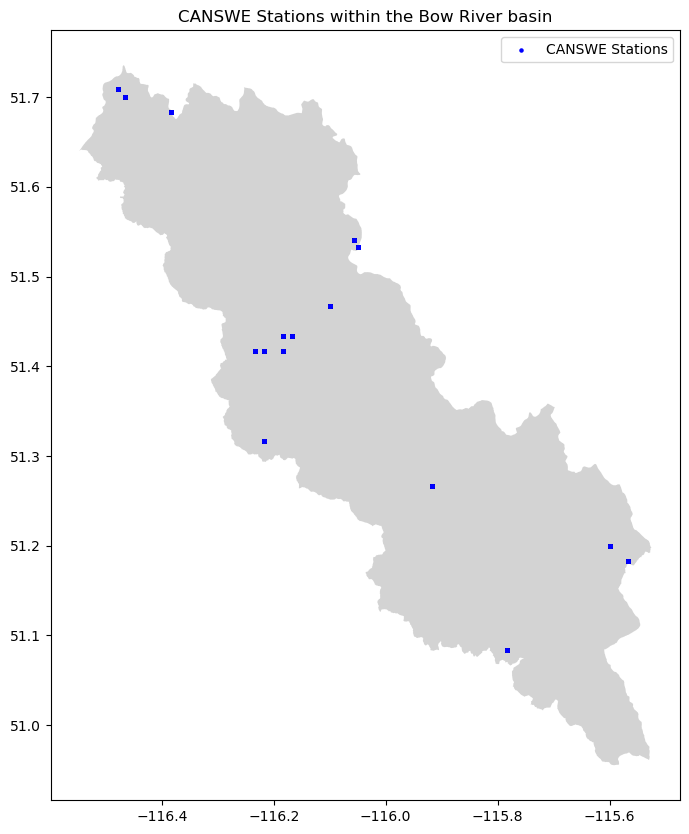

In [39]:
#save the updated coordinates to nc file
# Drop the geometry column before converting to xarray Dataset
SWE_v6_gdf_no_geometry = SWE_v6_gdf.drop(columns='geometry')

# Create a new netCDF file
SWE_v6_updated = xr.Dataset.from_dataframe(SWE_v6_gdf_no_geometry)
SWE_v6_updated.to_netcdf('CANSWE-CanEEN_1928-2023_v6_updated.nc')  

# Plot the stations within the study area
fig, ax = plt.subplots(figsize=(10, 10))
Bow_shapefile.plot(ax=ax, color='lightgrey')
SWE_v6_gdf.plot(ax=ax, color='blue', markersize=5)
plt.title('CANSWE Stations within the Bow River basin')
plt.legend(['CANSWE Stations'])
plt.show()

In [17]:
print(SWE_v6_gdf_no_geometry.columns)

Index(['lat', 'lon', 'elevation', 'source', 'station_name', 'station_name_sec',
       'station_name_ter', 'station_id_sec', 'station_id_ter', 'type_mes',
       'snw', 'snd', 'den', 'data_flag_snw', 'data_flag_snd', 'qc_flag_snw',
       'qc_flag_snd', 'index_right', 'Station_ID', 'Station_Na', 'Area_km2',
       'Source'],
      dtype='object')


In [9]:
print(SWE_v6_gdf.head())

# Assuming the elevation variable is named 'elevation'
elevation_data = SWE_v6_gdf['elevation']

# Calculate the elevation range
min_elevation = elevation_data.min()
max_elevation = elevation_data.max()

print(f"Elevation range in the dataset CANSWE_v6: {min_elevation} to {max_elevation}")

                              lat         lon  elevation               source  \
station_id  time                                                                
ALE-05BA811 1928-01-01  51.700001 -116.466667     2080.0  Alberta Environment   
            1928-01-02  51.700001 -116.466667     2080.0  Alberta Environment   
            1928-01-03  51.700001 -116.466667     2080.0  Alberta Environment   
            1928-01-04  51.700001 -116.466667     2080.0  Alberta Environment   
            1928-01-05  51.700001 -116.466667     2080.0  Alberta Environment   

                            station_name station_name_sec station_name_ter  \
station_id  time                                                             
ALE-05BA811 1928-01-01  BOW SUMMIT (OLD)             None             None   
            1928-01-02  BOW SUMMIT (OLD)             None             None   
            1928-01-03  BOW SUMMIT (OLD)             None             None   
            1928-01-04  BOW SUMMIT (OLD)  

In [ ]:
# select stations within the study area

Bow_at_Banff_shapefile = gpd.read_file(Bow_at_Banff)
Bow_at_Banff_shapefile = Bow_at_Banff_shapefile.to_crs(epsg=4326) # convert to WGS84
Bow_shapefile = Bow_at_Banff_shapefile[Bow_at_Banff_shapefile["Station_Na"]=="BOW RIVER AT BANFF"]


# Gridded SWE

In [8]:
SWE = output_dir = 'C:/Users/walimunige.rupasingh/OneDrive - University of Calgary/Documents/Reasearch/Data/SWE_gridded/swe_daily_mm_19810101_19811231_nh.nc'

SWE_data = xr.open_dataset(SWE)

SWE_data = SWE_data.to_dataframe()

display(SWE_data)

time_bnds  swe
time                bnds lon     lat                  
1981-01-01 12:00:00 0    -179.75 0.25  1981-01-01  0.0
                                 0.75  1981-01-01  0.0
                                 1.25  1981-01-01  0.0
                                 1.75  1981-01-01  0.0
                                 2.25  1981-01-01  0.0
...                                           ...  ...
1981-12-31 12:00:00 1     179.75 87.75 1982-01-01  0.0
                                 88.25 1982-01-01  0.0
                                 88.75 1982-01-01  0.0
                                 89.25 1982-01-01  0.0
                                 89.75 1982-01-01  0.0

[94608000 rows x 2 columns]

In [13]:
# Extract 'lon' and 'lat' from the MultiIndex and add them as columns
SWE_data = SWE_data.reset_index()
SWE_data['lon'] = SWE_data['lon'].astype(float)
SWE_data['lat'] = SWE_data['lat'].astype(float)

display(SWE_data)

,index,time,bnds,lon,lat,time_bnds,swe
0,0,1981-01-01 12:00:00,0,-179.75,0.25,1981-01-01,0.0
1,1,1981-01-01 12:00:00,0,-179.75,0.75,1981-01-01,0.0
2,2,1981-01-01 12:00:00,0,-179.75,1.25,1981-01-01,0.0
3,3,1981-01-01 12:00:00,0,-179.75,1.75,1981-01-01,0.0
4,4,1981-01-01 12:00:00,0,-179.75,2.25,1981-01-01,0.0
...,...,...,...,...,...,...,...
94607995,94607995,1981-12-31 12:00:00,1,179.75,87.75,1982-01-01,0.0
94607996,94607996,1981-12-31 12:00:00,1,179.75,88.25,1982-01-01,0.0
94607997,94607997,1981-12-31 12:00:00,1,179.75,88.75,1982-01-01,0.0
94607998,94607998,1981-12-31 12:00:00,1,179.75,89.25,1982-01-01,0.0


In [14]:
# Convert the SWE data to a GeoDataFrame
geometry = [Point(xy) for xy in zip(SWE_data['lon'], SWE_data['lat'])]
crs = {'init': 'epsg:4326'}
SWE_gdf = gpd.GeoDataFrame(SWE_data, crs=crs, geometry=geometry)

# Select the stations within the study area
SWE_gdf = gpd.sjoin(SWE_gdf, Bow_shapefile, how='inner', op='intersects')

print(SWE_gdf.head())

c:\Users\walimunige.rupasingh\AppData\Local\anaconda3\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
c:\Users\walimunige.rupasingh\AppData\Local\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py:3445: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_25476\3969828185.py:7: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=eps

         index                time  bnds     lon    lat  time_bnds  \
23142    23142 1981-01-01 12:00:00     0 -115.75  51.25 1981-01-01   
152742  152742 1981-01-01 12:00:00     1 -115.75  51.25 1981-01-02   
282342  282342 1981-01-02 12:00:00     0 -115.75  51.25 1981-01-02   
411942  411942 1981-01-02 12:00:00     1 -115.75  51.25 1981-01-03   
541542  541542 1981-01-03 12:00:00     0 -115.75  51.25 1981-01-03   

               swe                     geometry  index_right Station_ID  \
23142   144.281555  POINT (-115.75000 51.25000)            0    05BB001   
152742  144.281555  POINT (-115.75000 51.25000)            0    05BB001   
282342  144.285172  POINT (-115.75000 51.25000)            0    05BB001   
411942  144.285172  POINT (-115.75000 51.25000)            0    05BB001   
541542  144.293976  POINT (-115.75000 51.25000)            0    05BB001   

                Station_Na  Area_km2     Source  
23142   BOW RIVER AT BANFF   2210.56  WSC_HYDAT  
152742  BOW RIVER AT BANFF  

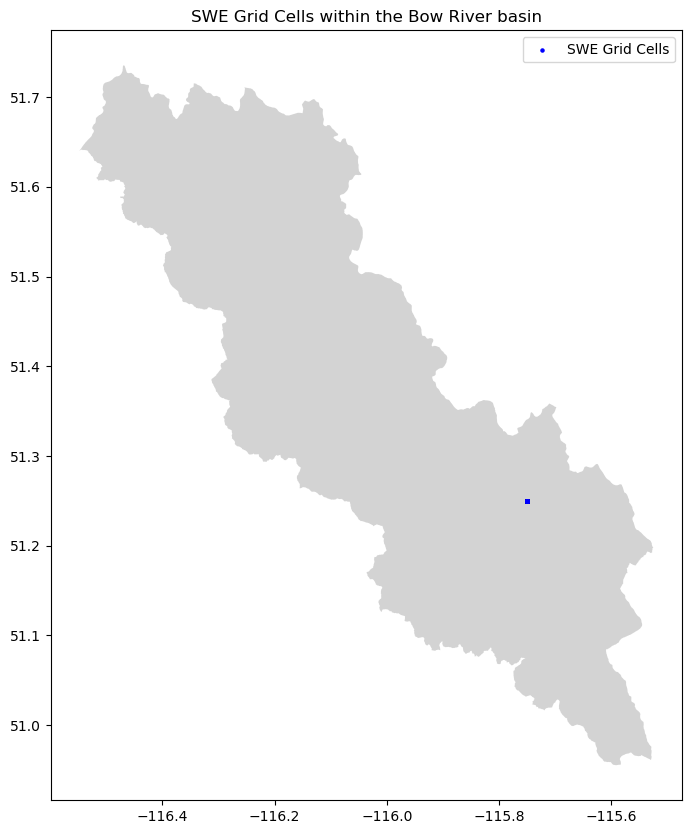

In [15]:
# Plot the stations within the study area
fig, ax = plt.subplots(figsize=(10, 10))
Bow_shapefile.plot(ax=ax, color='lightgrey')
SWE_gdf.plot(ax=ax, color='blue', markersize=5)
plt.title('SWE Grid Cells within the Bow River basin')
plt.legend(['SWE Grid Cells'])
plt.show()

In [11]:
# daily mean SWE
daily_mean_SWE = SWE_data.groupby('time').mean()
display(daily_mean_SWE)

C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_25476\3154662513.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  daily_mean_SWE = SWE_data.groupby('time').mean()


,bnds,lon,lat,swe
time,,,,
1981-01-01 12:00:00,0.5,0.0,45.0,15.603696
1981-01-02 12:00:00,0.5,0.0,45.0,15.772094
1981-01-03 12:00:00,0.5,0.0,45.0,15.948147
1981-01-04 12:00:00,0.5,0.0,45.0,16.119921
1981-01-05 12:00:00,0.5,0.0,45.0,16.293947
...,...,...,...,...
1981-12-27 12:00:00,0.5,0.0,45.0,15.180366
1981-12-28 12:00:00,0.5,0.0,45.0,15.358402
1981-12-29 12:00:00,0.5,0.0,45.0,15.501713


In [16]:
# List the NetCDF files
nc_files = [os.path.join(gridded_SWE, f) for f in os.listdir(gridded_SWE) if f.endswith('.nc')]

# Function to filter data within the shapefile
def filter_data_within_shape(dataset, shape):
    # Convert the dataset to a DataFrame
    df = dataset.to_dataframe().reset_index()
    df['lon'] = df['lon'].astype(float)
    df['lat'] = df['lat'].astype(float)

    geometry = [Point(xy) for xy in zip(df['lon'], df['lat'])]
    crs = {'init': 'epsg:4326'}
    
    # Create a GeoDataFrame from the DataFrame
    gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lon, df.lat))
    
    # Perform spatial join to filter points within the shape
    filtered_gdf = gpd.sjoin(gdf, shape, how='inner', op='intersects')
    
    # Drop the geometry column to convert back to a regular DataFrame
    filtered_df = filtered_gdf.drop(columns='geometry')
    
    return filtered_df

# Initialize an empty list to store filtered DataFrames
filtered_SWE_dfs = []

# Loop through each NetCDF file, filter the data, and append to the list
for nc_file in nc_files:
    dataset = xr.open_dataset(nc_file)
    filtered_df = filter_data_within_shape(dataset, Bow_shapefile)
    filtered_SWE_dfs.append(filtered_df)
    #save the filtered data to nc file
    #filtered_data = xr.Dataset.from_dataframe(filtered_df)
    #filtered_data.to_netcdf(f'filtered_{os.path.basename(nc_file)}')
    #print(f"Filtered data saved as filtered_{os.path.basename(nc_file)}")
    

# Concatenate all filtered DataFrames
combined_df = pd.concat(filtered_SWE_dfs, ignore_index=True)

print(combined_df.head())

c:\Users\walimunige.rupasingh\AppData\Local\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py:3505: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_25476\212743469.py:18: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  filtered_gdf = gpd.sjoin(gdf, shape, how='inner', op='intersects')
c:\Users\walimunige.rupasingh\AppData\Local\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py:3505: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\walimunige.rupasingh\AppD

KeyboardInterrupt: 

# Read CAPA and RDRS data

In [2]:
# test one day data
test_one_day = 'C:/Users/walimunige.rupasingh/OneDrive - University of Calgary/Documents/Reasearch/Data/test/1980010212.nc'
test_one_day_data = xr.open_dataset(test_one_day)
test_one_day_data = test_one_day_data.to_dataframe()
test_one_day_data = test_one_day_data.reset_index()
test_one_day_data['time'] = pd.to_datetime(test_one_day_data['time'].values)
test_one_day_data.set_index('time', inplace=True)

geometry_test = [Point(xy) for xy in zip(test_one_day_data['lon'], test_one_day_data['lat'])]
crs = {'init': 'epsg:4326'}
test_data_gdf = gpd.GeoDataFrame(test_one_day_data, crs=crs, geometry=geometry_test)

#print(test_data_gdf.head())

# Select the stations within the study area
test_data_gdf = gpd.sjoin(test_data_gdf, Bow_shapefile, how='inner', op='intersects')

# Plot the stations within the study area
fig, ax = plt.subplots(figsize=(10, 10))
Bow_shapefile.plot(ax=ax, color='lightgrey')
test_data_gdf.plot(ax=ax, color='red', markersize=5)
plt.show()

c:\Users\walimunige.rupasingh\AppData\Local\anaconda3\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


NameError: name 'Bow_shapefile' is not defined

In [ ]:
# check 

In [38]:
# Reset the index to make 'time' a column again
test_one_day_data_reset = test_one_day_data.reset_index()

# Print coordinates of the stations
print(test_one_day_data_reset[['time']].drop_duplicates())

                  time
0  1980-01-02 13:00:00
1  1980-01-02 14:00:00
2  1980-01-02 15:00:00
3  1980-01-02 16:00:00
4  1980-01-02 17:00:00
5  1980-01-02 18:00:00
6  1980-01-02 19:00:00
7  1980-01-02 20:00:00
8  1980-01-02 21:00:00
9  1980-01-02 22:00:00
10 1980-01-02 23:00:00
11 1980-01-03 00:00:00
12 1980-01-03 01:00:00
13 1980-01-03 02:00:00
14 1980-01-03 03:00:00
15 1980-01-03 04:00:00
16 1980-01-03 05:00:00
17 1980-01-03 06:00:00
18 1980-01-03 07:00:00
19 1980-01-03 08:00:00
20 1980-01-03 09:00:00
21 1980-01-03 10:00:00
22 1980-01-03 11:00:00
23 1980-01-03 12:00:00


In [42]:
# Directory containing the NetCDF files
nc_files_dir = 'C:/Users/walimunige.rupasingh/OneDrive - University of Calgary/Documents/Reasearch/Data/CAPA'

# List the NetCDF files
nc_files = [os.path.join(nc_files_dir, f) for f in os.listdir(nc_files_dir) if f.endswith('.nc')]

# Function to filter data within the shapefile
def filter_data_within_shape(dataset, shape):
    # Convert the dataset to a DataFrame
    df = dataset.to_dataframe().reset_index()

    geometry = [Point(xy) for xy in zip(df['lon'], df['lat'])]
    crs = {'init': 'epsg:4326'}
    
    # Create a GeoDataFrame from the DataFrame
    gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lon, df.lat))
    
    # Perform spatial join to filter points within the shape
    filtered_gdf = gpd.sjoin(gdf, shape, how='inner', op='intersects')
    
    # Drop the geometry column to convert back to a regular DataFrame
    filtered_df = filtered_gdf.drop(columns='geometry')
    
    return filtered_df

# Initialize an empty list to store filtered DataFrames
filtered_dfs = []

# Loop through each NetCDF file, filter the data, and append to the list
for nc_file in nc_files:
    dataset = xr.open_dataset(nc_file)
    filtered_df = filter_data_within_shape(dataset, Bow_shapefile)
    filtered_dfs.append(filtered_df)
    #save the filtered data to nc file
    #filtered_data = xr.Dataset.from_dataframe(filtered_df)
    #filtered_data.to_netcdf(f'filtered_{os.path.basename(nc_file)}')
    #print(f"Filtered data saved as filtered_{os.path.basename(nc_file)}")
    

# Concatenate all filtered DataFrames
combined_df = pd.concat(filtered_dfs, ignore_index=True)

print(combined_df.head())

# Save the DataFrame to a CSV file
#combined_df.to_csv('combined_precip_data.csv', index=False)

#print("Combined data saved to 'combined_precip_data.nc'")

c:\Users\walimunige.rupasingh\AppData\Local\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py:3505: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_32808\3069935892.py:19: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  filtered_gdf = gpd.sjoin(gdf, shape, how='inner', op='intersects')
c:\Users\walimunige.rupasingh\AppData\Local\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py:3505: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\walimunige.rupasingh\App

       rlat        rlon                time        lat         lon  \
0 -4.770001  345.572784 2019-01-01 12:00:00  50.972343 -115.625092   
1 -4.680001  345.572784 2019-01-01 12:00:00  51.057087 -115.673279   
2 -4.590001  345.482788 2019-01-01 12:00:00  51.111439 -115.856125   
3 -4.590001  345.572784 2019-01-01 12:00:00  51.141815 -115.721619   
4 -4.590001  345.662781 2019-01-01 12:00:00  51.172024 -115.586960   

   CaPA_coarse_A_PR_SFC  rotated_pole  index_right Station_ID  \
0              0.000328  9.969210e+36            0    05BB001   
1              0.000235  9.969210e+36            0    05BB001   
2              0.000246  9.969210e+36            0    05BB001   
3              0.000198  9.969210e+36            0    05BB001   
4              0.000155  9.969210e+36            0    05BB001   

           Station_Na  Area_km2     Source  
0  BOW RIVER AT BANFF   2210.56  WSC_HYDAT  
1  BOW RIVER AT BANFF   2210.56  WSC_HYDAT  
2  BOW RIVER AT BANFF   2210.56  WSC_HYDAT  
3  BOW R

In [50]:
nc_files_dir_RDRS = 'C:/Users/walimunige.rupasingh/OneDrive - University of Calgary/Documents/Reasearch/Data/RDRS'
# List the NetCDF files
nc_files_RDRS = [os.path.join(nc_files_dir_RDRS, f) for f in os.listdir(nc_files_dir_RDRS) if f.endswith('.nc')]

# Initialize an empty list to store filtered DataFrames
filtered_dfs_RDRS = []

# Loop through each NetCDF file, filter the data, and append to the list
for nc_file_RDRS in nc_files_RDRS:
    dataset_RDRS = xr.open_dataset(nc_file_RDRS)
    filtered_df_RDRS = filter_data_within_shape(dataset_RDRS, Bow_shapefile)
    filtered_dfs_RDRS.append(filtered_df_RDRS)

# Concatenate all filtered DataFrames
combined_df_RDRS = pd.concat(filtered_dfs_RDRS, ignore_index=True)

print(combined_df_RDRS.head())

c:\Users\walimunige.rupasingh\AppData\Local\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py:3505: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_32808\3069935892.py:19: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  filtered_gdf = gpd.sjoin(gdf, shape, how='inner', op='intersects')
c:\Users\walimunige.rupasingh\AppData\Local\anaconda3\Lib\site-packages\IPython\core\interactiveshell.py:3505: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)
C:\Users\walimunige.rupasingh\App

   rlat        rlon                time        lat         lon  \
0 -4.77  345.572784 1980-01-01 13:00:00  50.972343 -115.625092   
1 -4.77  345.572784 1980-01-01 14:00:00  50.972343 -115.625092   
2 -4.77  345.572784 1980-01-01 15:00:00  50.972343 -115.625092   
3 -4.77  345.572784 1980-01-01 16:00:00  50.972343 -115.625092   
4 -4.77  345.572784 1980-01-01 17:00:00  50.972343 -115.625092   

   RDRS_v2.1_A_PR0_SFC  rotated_pole  index_right Station_ID  \
0             0.000010  9.969210e+36            0    05BB001   
1             0.000014  9.969210e+36            0    05BB001   
2             0.000025  9.969210e+36            0    05BB001   
3             0.000044  9.969210e+36            0    05BB001   
4             0.000059  9.969210e+36            0    05BB001   

           Station_Na  Area_km2     Source  
0  BOW RIVER AT BANFF   2210.56  WSC_HYDAT  
1  BOW RIVER AT BANFF   2210.56  WSC_HYDAT  
2  BOW RIVER AT BANFF   2210.56  WSC_HYDAT  
3  BOW RIVER AT BANFF   2210.56  WSC_H

In [43]:
# Drop the geometry column before converting to xarray Dataset
#combined_df_no_geometry = combined_df.drop(columns='geometry')

# Create a new netCDF file
combined_data = xr.Dataset.from_dataframe(combined_df)
#save the combined data to a nc file
#combined_data.to_netcdf('combined_precip_data.nc')
print(combined_data.head())


<xarray.Dataset>
Dimensions:               (index: 5)
Coordinates:
  * index                 (index) int64 0 1 2 3 4
Data variables:
    rlat                  (index) float64 -4.77 -4.68 -4.59 -4.59 -4.59
    rlon                  (index) float64 345.6 345.6 345.5 345.6 345.7
    time                  (index) datetime64[ns] 2019-01-01T12:00:00 ... 2019...
    lat                   (index) float32 50.97 51.06 51.11 51.14 51.17
    lon                   (index) float32 -115.6 -115.7 -115.9 -115.7 -115.6
    CaPA_coarse_A_PR_SFC  (index) float32 0.0003284 0.0002348 ... 0.0001554
    rotated_pole          (index) float32 9.969e+36 9.969e+36 ... 9.969e+36
    index_right           (index) int64 0 0 0 0 0
    Station_ID            (index) object '05BB001' '05BB001' ... '05BB001'
    Station_Na            (index) object 'BOW RIVER AT BANFF' ... 'BOW RIVER ...
    Area_km2              (index) float64 2.211e+03 2.211e+03 ... 2.211e+03
    Source                (index) object 'WSC_HYDAT' 'WSC_H

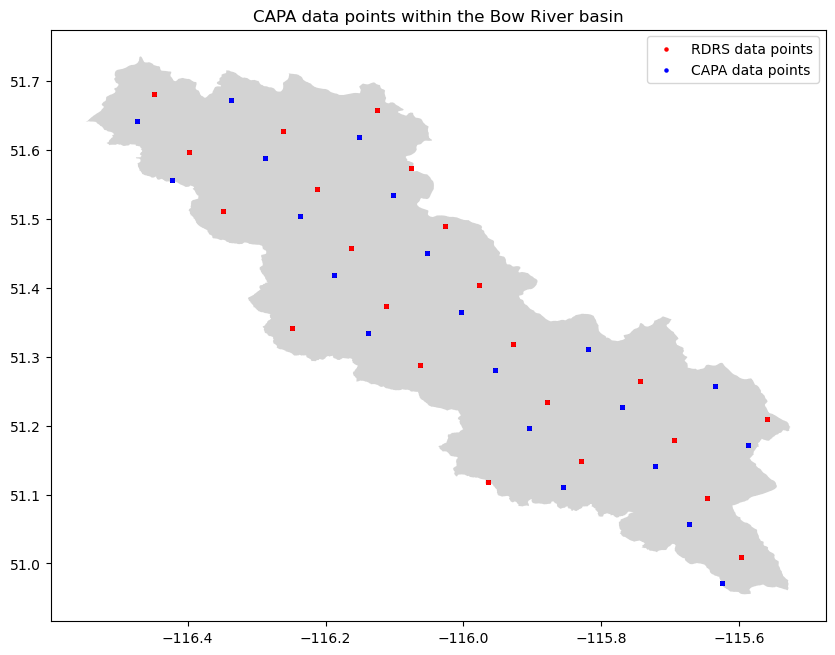

In [54]:
# Create a GeoDataFrame from the DataFrame
geometry = [Point(xy) for xy in zip(combined_df['lon'], combined_df['lat'])]
combined_gdf = gpd.GeoDataFrame(combined_df, geometry=geometry)

geometry1 = [Point(xy) for xy in zip(combined_df_RDRS['lon'], combined_df_RDRS['lat'])]
combined_gdf_RDRS = gpd.GeoDataFrame(combined_df_RDRS, geometry=geometry1)

# Plot the stations within the study area
fig, ax = plt.subplots(figsize=(10, 10))
Bow_shapefile.plot(ax=ax, color='lightgrey')
#SWE_v6_gdf.plot(ax=ax, color='blue', markersize=5)
combined_gdf.plot(ax=ax, color='red', markersize=5)
combined_gdf_RDRS.plot(ax=ax, color='blue', markersize=5)
plt.title('CAPA data points within the Bow River basin')
plt.legend([ 'RDRS data points','CAPA data points'])
plt.show()

In [45]:
#print coorditates of the stations
print(combined_df[['time']].drop_duplicates())


                     time
0     2019-01-01 12:00:00
21    2019-01-02 12:00:00
42    2019-01-03 12:00:00
63    2019-01-04 12:00:00
84    2019-01-05 12:00:00
...                   ...
44740 2024-10-25 12:00:00
44762 2024-10-26 12:00:00
44784 2024-10-27 12:00:00
44806 2024-10-28 12:00:00
44828 2024-10-29 12:00:00

[2129 rows x 1 columns]


In [46]:
# Create a pivot table to rearrange the data
pivot_df = combined_df.pivot_table(index='time', columns=['lat', 'lon'], values='CaPA_coarse_A_PR_SFC')

# Reset the index to make 'time' a column again
pivot_df.reset_index(inplace=True)

# Display the resulting DataFrame
print(pivot_df)

lat                 time   50.97234344482422    51.0096435546875  \
lon                      -115.62509155273438 -115.59791564941406   
0    2019-01-01 12:00:00            0.000328                 NaN   
1    2019-01-02 12:00:00            0.000023                 NaN   
2    2019-01-03 12:00:00            0.000017                 NaN   
3    2019-01-04 12:00:00            0.000695                 NaN   
4    2019-01-05 12:00:00            0.000010                 NaN   
...                  ...                 ...                 ...   
2124 2024-10-25 12:00:00                 NaN            0.000000   
2125 2024-10-26 12:00:00                 NaN            0.000000   
2126 2024-10-27 12:00:00                 NaN            0.000122   
2127 2024-10-28 12:00:00                 NaN            0.002327   
2128 2024-10-29 12:00:00                 NaN            0.000059   

lat    51.05708694458008 51.09467697143555    51.1114387512207  \
lon  -115.67327880859375 -115.646240234375 -115.8

In [55]:
# Create a pivot table to rearrange the data
pivot_df_RDRS = combined_df_RDRS.pivot_table(index='time', columns=['lat', 'lon'], values='RDRS_v2.1_A_PR0_SFC')

# Reset the index to make 'time' a column again
pivot_df_RDRS.reset_index(inplace=True)

# Display the resulting DataFrame
print(pivot_df_RDRS)

lat                   time   50.97234344482422   51.05708694458008  \
lon                        -115.62509155273438 -115.67327880859375   
0      1980-01-01 13:00:00        1.025851e-05        1.279101e-05   
1      1980-01-01 14:00:00        1.402724e-05        1.369977e-05   
2      1980-01-01 15:00:00        2.516557e-05        1.912021e-05   
3      1980-01-01 16:00:00        4.350076e-05        3.224731e-05   
4      1980-01-01 17:00:00        5.873994e-05        5.267659e-05   
...                    ...                 ...                 ...   
341851 2018-12-31 08:00:00        4.765566e-07        2.716753e-07   
341852 2018-12-31 09:00:00        2.573320e-08        1.489512e-07   
341853 2018-12-31 10:00:00        2.706672e-21        0.000000e+00   
341854 2018-12-31 11:00:00        0.000000e+00        0.000000e+00   
341855 2018-12-31 12:00:00        0.000000e+00        0.000000e+00   

lat       51.1114387512207  51.141815185546875  51.172027587890625  \
lon    -115.8561248

In [47]:
# Reset the index to access the 'time' column
combined_df.reset_index(inplace=True)

# Create a new column for coordinate IDs
combined_df['coordinate_id'] = combined_df.groupby(['lat', 'lon']).ngroup() + 1

# Rearrange the DataFrame to have the new columns in the desired order
combined_df = combined_df[['coordinate_id', 'lon', 'lat', 'time', 'CaPA_coarse_A_PR_SFC']]

# Convert the hourly data to daily precipitation
combined_df['date'] = combined_df['time'].dt.date
daily_precipitation = combined_df.groupby(['coordinate_id', 'lon', 'lat', 'date'])['CaPA_coarse_A_PR_SFC'].sum().reset_index()

# Multiply the daily precipitation by 1000 to convert to mm
daily_precipitation['CaPA_coarse_A_PR_SFC'] *= 1000

# Rename columns for clarity
daily_precipitation.rename(columns={'date': 'time', 'CaPA_coarse_A_PR_SFC': 'daily_precipitation'}, inplace=True)

# Display the resulting DataFrame
print(daily_precipitation)

       coordinate_id         lon        lat        time  daily_precipitation
0                  1 -115.625092  50.972343  2019-01-01             0.328368
1                  1 -115.625092  50.972343  2019-01-02             0.023446
2                  1 -115.625092  50.972343  2019-01-03             0.016599
3                  1 -115.625092  50.972343  2019-01-04             0.695444
4                  1 -115.625092  50.972343  2019-01-05             0.009971
...              ...         ...        ...         ...                  ...
44845             43 -116.448883  51.681141  2024-10-25             0.002644
44846             43 -116.448883  51.681141  2024-10-26             0.000000
44847             43 -116.448883  51.681141  2024-10-27             3.411551
44848             43 -116.448883  51.681141  2024-10-28             0.914088
44849             43 -116.448883  51.681141  2024-10-29             0.232695

[44850 rows x 5 columns]


In [56]:
# Reset the index to access the 'time' column
combined_df_RDRS.reset_index(inplace=True)

# Create a new column for coordinate IDs
combined_df_RDRS['coordinate_id'] = combined_df_RDRS.groupby(['lat', 'lon']).ngroup() + 1
# Rearrange the DataFrame to have the new columns in the desired order
combined_df_RDRS = combined_df_RDRS[['coordinate_id', 'lon', 'lat', 'time', 'RDRS_v2.1_A_PR0_SFC']]

# Convert the hourly data to daily precipitation
combined_df_RDRS['date'] = combined_df_RDRS['time'].dt.date
daily_precipitation_RDRS = combined_df_RDRS.groupby(['coordinate_id', 'lon', 'lat', 'date'])['RDRS_v2.1_A_PR0_SFC'].sum().reset_index()

# Multiply the daily precipitation by 1000 to convert to mm
daily_precipitation_RDRS['RDRS_v2.1_A_PR0_SFC'] *= 1000

# Rename columns for clarity
daily_precipitation_RDRS.rename(columns={'date': 'time', 'RDRS_v2.1_A_PR0_SFC': 'daily_precipitation'}, inplace=True)

# Display the resulting DataFrame
print(daily_precipitation_RDRS)

        coordinate_id         lon        lat        time  daily_precipitation
0                   1 -115.625092  50.972343  1980-01-01             0.254825
1                   1 -115.625092  50.972343  1980-01-02             0.362730
2                   1 -115.625092  50.972343  1980-01-03             1.083391
3                   1 -115.625092  50.972343  1980-01-04             0.093789
4                   1 -115.625092  50.972343  1980-01-05             0.339676
...               ...         ...        ...         ...                  ...
299140             21 -116.337173  51.672558  2018-12-27             0.101965
299141             21 -116.337173  51.672558  2018-12-28             0.621428
299142             21 -116.337173  51.672558  2018-12-29             1.788441
299143             21 -116.337173  51.672558  2018-12-30             4.915802
299144             21 -116.337173  51.672558  2018-12-31             0.000000

[299145 rows x 5 columns]


In [53]:
# Ensure 'time' column is in datetime format
daily_precipitation['time'] = pd.to_datetime(daily_precipitation['time'])

# Set 'time' as the index
daily_precipitation.set_index('time', inplace=True)

# Save the daily precipitation data to a nc file
daily_precipitation_CAPA = xr.Dataset.from_dataframe(daily_precipitation)
daily_precipitation_CAPA.to_netcdf('C:/Users/walimunige.rupasingh/OneDrive - University of Calgary/Documents/Reasearch/Snow_drought_indicator/snowdroughtindex/data/daily_precipitation.nc')

In [57]:
# Ensure 'time' column is in datetime format
daily_precipitation_RDRS['time'] = pd.to_datetime(daily_precipitation_RDRS['time'])

# Set 'time' as the index
daily_precipitation_RDRS.set_index('time', inplace=True)

# Save the daily precipitation data to a nc file
daily_precipitation_RDRS = xr.Dataset.from_dataframe(daily_precipitation_RDRS)
daily_precipitation_RDRS.to_netcdf('C:/Users/walimunige.rupasingh/OneDrive - University of Calgary/Documents/Reasearch/Snow_drought_indicator/snowdroughtindex/data/daily_precipitation_RDRS.nc')

In [21]:
#rearrange columns according to lan and lon
combined_df = combined_df[['lat', 'lon', 'time', 'RDRS_v2.1_A_PR0_SFC']]
combined_df = combined_df.reset_index()
combined_df['time'] = pd.to_datetime(combined_df['time'].values)
combined_df.set_index('time', inplace=True)
print

<function print(*args, sep=' ', end='\n', file=None, flush=False)>

In [47]:
# Rename columns to match the required names
combined_df.rename(columns={
	'Station_ID': 'station_id',
	'precipitation': 'precipitation_amount'  # Ensure this column exists
}, inplace=True)

# Rearrange the columns to match the CANSWE_v6 data
combined_df = combined_df[['station_id', 'time', 'lat', 'lon', 'precipitation_amount']]
combined_df['time'] = pd.to_datetime(combined_df['time'])
combined_df.set_index('time', inplace=True)
combined_df.sort_index(inplace=True)

print(combined_df.head())

KeyError: "['precipitation_amount'] not in index"

# Daily precipitation data

In [13]:
precipitation_path = 'C:/Users/walimunige.rupasingh/OneDrive - University of Calgary/Documents/Reasearch/Snow_drought_indicator/snowdroughtindex/data/input_data/combined_precip_data.nc'
precipitation = xr.open_dataset(precipitation_path)
precipitation_data = precipitation.to_dataframe()
precipitation_data = precipitation_data.reset_index()
precipitation_data['time'] = pd.to_datetime(precipitation_data['time'].values)
precipitation_data.set_index('time', inplace=True)
print(precipitation_data.head())
print(precipitation_data.tail())

                     index  rlat        rlon        lat         lon  \
time                                                                  
1980-01-01 13:00:00      0 -4.77  345.572784  50.972343 -115.625092   
1980-01-01 14:00:00      1 -4.77  345.572784  50.972343 -115.625092   
1980-01-01 15:00:00      2 -4.77  345.572784  50.972343 -115.625092   
1980-01-01 16:00:00      3 -4.77  345.572784  50.972343 -115.625092   
1980-01-01 17:00:00      4 -4.77  345.572784  50.972343 -115.625092   

                     RDRS_v2.1_A_PR0_SFC  rotated_pole  index_right  \
time                                                                  
1980-01-01 13:00:00             0.000010  9.969210e+36            0   
1980-01-01 14:00:00             0.000014  9.969210e+36            0   
1980-01-01 15:00:00             0.000025  9.969210e+36            0   
1980-01-01 16:00:00             0.000044  9.969210e+36            0   
1980-01-01 17:00:00             0.000059  9.969210e+36            0   

    

In [23]:
# divide the data into two parts 1980 - 2018 and 2019 - 2023
precipitation_data_1980_2018 = precipitation_data.loc['1980-01-01':'2018-12-31']
precipitation_data_2019_2023 = precipitation_data.loc['2019-01-01':'2023-07-31']

print(precipitation_data_1980_2018.head())
print(precipitation_data_1980_2018.tail())
print(precipitation_data_2019_2023.head())
print(precipitation_data_2019_2023.tail())

C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_30016\1202715932.py:2: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  precipitation_data_1980_2018 = precipitation_data.loc['1980-01-01':'2018-12-31']


                     index  rlat        rlon        lat         lon  \
time                                                                  
1980-01-01 13:00:00      0 -4.77  345.572784  50.972343 -115.625092   
1980-01-01 14:00:00      1 -4.77  345.572784  50.972343 -115.625092   
1980-01-01 15:00:00      2 -4.77  345.572784  50.972343 -115.625092   
1980-01-01 16:00:00      3 -4.77  345.572784  50.972343 -115.625092   
1980-01-01 17:00:00      4 -4.77  345.572784  50.972343 -115.625092   

                     RDRS_v2.1_A_PR0_SFC  rotated_pole  index_right  \
time                                                                  
1980-01-01 13:00:00             0.000010  9.969210e+36            0   
1980-01-01 14:00:00             0.000014  9.969210e+36            0   
1980-01-01 15:00:00             0.000025  9.969210e+36            0   
1980-01-01 16:00:00             0.000044  9.969210e+36            0   
1980-01-01 17:00:00             0.000059  9.969210e+36            0   

    

C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_30016\1202715932.py:3: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  precipitation_data_2019_2023 = precipitation_data.loc['2019-01-01':'2023-07-31']


In [24]:
# drop the columns that are not needed
precipitation_data_1980_2018 = precipitation_data_1980_2018.drop(columns=['CaPA_coarse_A_PR_SFC'])
precipitation_data_2019_2023 = precipitation_data_2019_2023.drop(columns=['RDRS_v2.1_A_PR0_SFC']) 

print(precipitation_data_1980_2018.head())
print(precipitation_data_2019_2023.head())

                     index  rlat        rlon        lat         lon  \
time                                                                  
1980-01-01 13:00:00      0 -4.77  345.572784  50.972343 -115.625092   
1980-01-01 14:00:00      1 -4.77  345.572784  50.972343 -115.625092   
1980-01-01 15:00:00      2 -4.77  345.572784  50.972343 -115.625092   
1980-01-01 16:00:00      3 -4.77  345.572784  50.972343 -115.625092   
1980-01-01 17:00:00      4 -4.77  345.572784  50.972343 -115.625092   

                     RDRS_v2.1_A_PR0_SFC  rotated_pole  index_right  \
time                                                                  
1980-01-01 13:00:00             0.000010  9.969210e+36            0   
1980-01-01 14:00:00             0.000014  9.969210e+36            0   
1980-01-01 15:00:00             0.000025  9.969210e+36            0   
1980-01-01 16:00:00             0.000044  9.969210e+36            0   
1980-01-01 17:00:00             0.000059  9.969210e+36            0   

    

In [25]:
# rename the columns
precipitation_data_1980_2018.rename(columns={"RDRS_v2.1_A_PR0_SFC": "precipitation"}, inplace=True)
precipitation_data_2019_2023.rename(columns={"CaPA_coarse_A_PR_SFC": "precipitation"}, inplace=True)

# calculate the daily precipitation sum and convert to mm
precipitation_data_1980_2018_daily = precipitation_data_1980_2018.resample('D').sum()*1000
precipitation_data_2019_2023_daily = precipitation_data_2019_2023.resample('D').sum()*1000

print(precipitation_data_1980_2018_daily.head())
print(precipitation_data_2019_2023_daily.head())

                 index          rlat          rlon         lat         lon  \
time                                                                         
1980-01-01    56595000 -1.000890e+06  7.980652e+07  11862522.0 -26795302.0   
1980-01-02   243180000 -2.183760e+06  1.741233e+08  25881868.0 -58462476.0   
1980-01-03   497196000 -2.183760e+06  1.741233e+08  25881868.0 -58462476.0   
1980-01-04   751212000 -2.183760e+06  1.741233e+08  25881868.0 -58462476.0   
1980-01-05  1005228000 -2.183760e+06  1.741233e+08  25881868.0 -58462476.0   

            precipitation  rotated_pole  index_right      Area_km2  
time                                                                
1980-01-01       3.655582           NaN            0  5.106394e+08  
1980-01-02      11.633369           NaN            0  1.114122e+09  
1980-01-03      49.376736           NaN            0  1.114122e+09  
1980-01-04      16.477839           NaN            0  1.114122e+09  
1980-01-05      10.665323           NaN

C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_30016\3845860492.py:6: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  precipitation_data_1980_2018_daily = precipitation_data_1980_2018.resample('D').sum()*1000
C:\Users\walimunige.rupasingh\AppData\Local\Temp\ipykernel_30016\3845860492.py:7: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  precipitation_data_2019_2023_daily = precipitation_data_2019_2023.resample('D').sum()*1000


In [26]:
# join the two dataframes
precipitation_data_daily = pd.concat([precipitation_data_1980_2018_daily, precipitation_data_2019_2023_daily])

print(precipitation_data_daily.head())
print(precipitation_data_daily.tail())

                 index          rlat          rlon         lat         lon  \
time                                                                         
1980-01-01    56595000 -1.000890e+06  7.980652e+07  11862522.0 -26795302.0   
1980-01-02   243180000 -2.183760e+06  1.741233e+08  25881868.0 -58462476.0   
1980-01-03   497196000 -2.183760e+06  1.741233e+08  25881868.0 -58462476.0   
1980-01-04   751212000 -2.183760e+06  1.741233e+08  25881868.0 -58462476.0   
1980-01-05  1005228000 -2.183760e+06  1.741233e+08  25881868.0 -58462476.0   

            precipitation  rotated_pole  index_right      Area_km2  
time                                                                
1980-01-01       3.655582           NaN            0  5.106394e+08  
1980-01-02      11.633369           NaN            0  1.114122e+09  
1980-01-03      49.376736           NaN            0  1.114122e+09  
1980-01-04      16.477839           NaN            0  1.114122e+09  
1980-01-05      10.665323           NaN

In [27]:
# save the data to a csv file
precipitation_data_daily.to_csv('C:/Users/walimunige.rupasingh/OneDrive - University of Calgary/Documents/Reasearch/Snow_drought_indicator/snowdroughtindex/data/output_data/combined_precip_data_daily.csv')

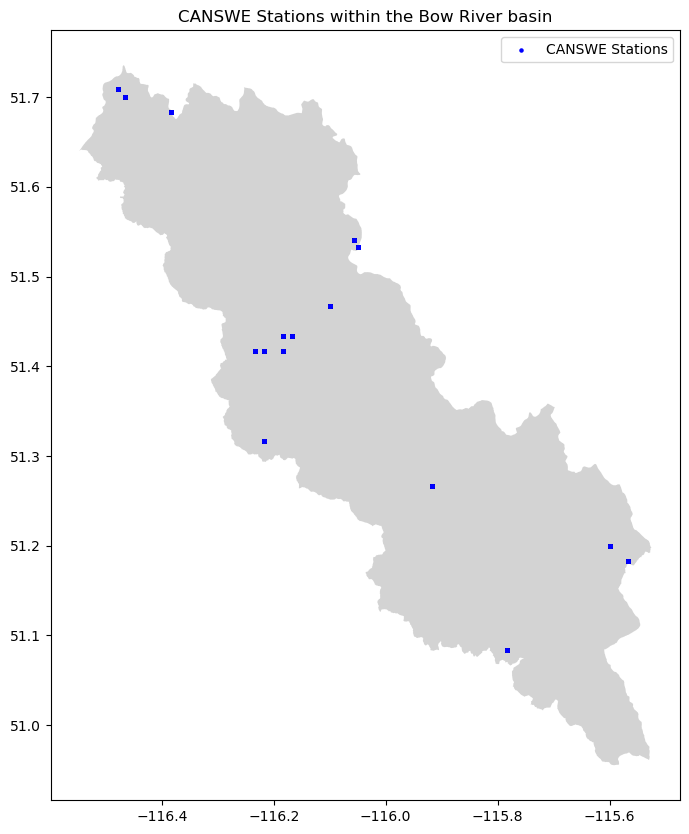

In [35]:
# Create a GeoDataFrame from the DataFrame
geometry1 = [Point(xy) for xy in zip(precipitation_data_daily['lon'], precipitation_data_daily['lat'])]
precipitation_data_daily_gdf = gpd.GeoDataFrame(precipitation_data_daily, geometry=geometry1)

# Plot the stations within the study area
fig, ax = plt.subplots(figsize=(10, 10))
Bow_shapefile.plot(ax=ax, color='lightgrey')
SWE_v6_gdf.plot(ax=ax, color='blue', markersize=5)
#precipitation_data_daily_gdf.plot(ax=ax, color='red', markersize=5)
plt.title('CANSWE Stations within the Bow River basin')
plt.legend(['CANSWE Stations', 'RDRS & CAPA data points'])
plt.show()